# Global Earth Observation imagery and HEALPix

## Authors & Contributors
### Authors
- Jean-Marc Delouis, LOPS - Laboratoire d'Oceanographie Physique et Spatiale
UMR 6523 CNRS-IFREMER-IRD-Univ.Brest-IUEM  (France), [@jmdelouis](https://github.com/jmdelouis)
- Tina Odaka, LOPS - Laboratoire d'Oceanographie Physique et Spatiale
UMR 6523 CNRS-IFREMER-IRD-Univ.Brest-IUEM (France), [@tinaok](https://github.com/tinaok)

### Contributors
- Anne Fouilloux, Simula (Norway), [@annefou](https://github.com/annefou)
- Justus Magin, LOPS - Laboratoire d'Oceanographie Physique et Spatiale
UMR 6523 CNRS-IFREMER-IRD-Univ.Brest-IUEM (France), [@keewis](https://github.com/keewis)

### Modelling publication
```{bibliography}
  :style: plain
  :list: bullet
  :filter: topic % "jmdelouis2022"
```


<div class="alert alert-info">
<i class="fa-question-circle fa" style="font-size: 22px;color:#666;"></i> Overview
    <br>
    <br>
    <b>Questions</b>
    <ul>
        <li>What is zarr?</li>
        <li>What is healpix grid?</li>
        <li>What is dask jupyter lab extention?</li>
        <li>How do I read Copernicus Marine SST data and transform it to healpix grid?</li>
    </ul>
    <b>Objectives</b>
    <ul>
        <li>Learn about Healpix</li>
        <li>Learn about Zarr, Dask, Dask Gateway, Dask Client, Scheduler, Workers</li>
    </ul>
</div>

## Context


Earth Observation images naturally represent data on a spheroidal surface. In this notebook, we introduce HEALPix, a powerful indexing scheme for organizing spheroidal data, together with the Zarr storage format. By combining these two technologies, we can analyze Earth Observation data in its native form.

Because remote sensing datasets can be quite large, we also use [Dask](https://docs.dask.org/) with [Xarray](https://docs.xarray.dev/en/stable/) to parallelize our data analysis. 


### Data

In this episode, we will be using datasets from [Copernicus Marine Service](https://marine.copernicus.eu):
- [ODYSSEA Global Sea Surface Temperature Gridded Level 4 Daily Multi-Sensor Observations](https://data.marine.copernicus.eu/product/SST_GLO_PHY_L4_NRT_010_043/description). DOI (product): [h10.48670/mds-00321](https://doi.org/10.48670/mds-00321))


The datasetst are probided in [Zarr](https://zarr.dev) format and Netcdf format and will be accessed through [S3-compatible object storage](https://en.wikipedia.org/wiki/Amazon_S3) or Ifremer's https server. 


## Setup

This episode uses the following main Python packages:

- numpy {cite:ps}`a-numpy-harris2020`   
- healpy {cite:ps}`a-healpy-zonca2024`   
- xarray {cite:ps}`a-xarray-hoyer2017` with [`netCDF4`](https://pypi.org/project/h5netcdf/), [`h5netcdf`](https://pypi.org/project/h5netcdf/) and [`zarr`](https://pypi.org/project/zarr/) engines
- xdggs {cite:ps}`a-xdggs-2024`                                                                           
- matplotlib {cite:ps}`a-matplotlib-Hunter2007`
- hvplot {cite:ps}`a-holoviews-rudiger2020`
- healpix-geo
- 
Please install these packages if not already available in your Python environment.

### Packages

In this episode, Python packages are imported when we start to use them. However, for best software practices, we recommend you to install and import all the necessary libraries at the top of your Jupyter notebook.

## Installation of required packages

In [1]:
!pip install -U xdggs copernicusmarine healpix_geo healpy flox

  Using cached xdggs-0.3.0-py3-none-any.whl.metadata (5.2 kB)
  Using cached copernicusmarine-2.2.2-py3-none-any.whl.metadata (8.2 kB)
  Using cached healpix_geo-0.0.6-cp312-cp312-manylinux_2_34_x86_64.whl.metadata (783 bytes)
  Using cached healpy-1.18.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.1 kB)
  Using cached flox-0.10.7-py3-none-any.whl.metadata (5.8 kB)
  Using cached cdshealpix-0.7.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.3 kB)
  Using cached h3ronpy-0.22.0-cp39-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.8 kB)
  Using cached arcosparse-0.4.2-py3-none-any.whl.metadata (5.2 kB)
  Using cached semver-3.0.4-py3-none-any.whl.metadata (6.8 kB)
Using cached xdggs-0.3.0-py3-none-any.whl (41 kB)
Using cached copernicusmarine-2.2.2-py3-none-any.whl (114 kB)
Using cached arcosparse-0.4.2-py3-none-any.whl (26 kB)
Using cached healpix_geo-0.0.6-cp312-cp312-manylinux_2_34_x86_64.whl (669 kB)
Using cached hea

## Import necessary libraries

In [1]:
import xarray as xr
import numpy as np
import fsspec

import pint_xarray
import cf_xarray.units  

import healpy as hp
import matplotlib.pyplot as plt

import xdggs

import hvplot.xarray

import copernicusmarine
from copernicusmarine.core_functions import custom_open_zarr  

from healpix_geo.nested import lonlat_to_healpix


## Create a local Dask cluster on the local machine

In [2]:
from dask.distributed import Client

client = Client()   # create a local dask cluster on the local machine.
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38435,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:45523,Total threads: 2
Dashboard: http://127.0.0.1:41053/status,Memory: 8.00 GiB
Nanny: tcp://127.0.0.1:46013,


Inspecting the `Cluster Info` section above gives us information about the created cluster: we have 2 or 4 workers and the same number of threads (e.g. 1 thread per worker). 



<div class="alert alert-warning">
    <i class="fa-check-circle fa" style="font-size: 22px;color:#666;"></i> <b>Go further</b>
    <br>
    <ul>
        <li> You can also create a local cluster with the `LocalCluster` constructor and use `n_workers` 
        and `threads_per_worker` to manually specify the number of processes and threads you want to use. 
        For instance, we could use `n_workers=2` and `threads_per_worker=2`.  </li>
        <li> This is sometimes preferable (in terms of performance), or when you run this tutorial on your PC, 
        you can avoid dask to use all your resources you have on your PC!  </li>
    </ul>
</div>

## Dask Dashboard

Dask comes with a really handy interface: the Dask Dashboard. It is a web interface that you can open in a separate tab of your browser.

We will learn here how to use it through the [Dask JupyterLab extension](https://github.com/dask/dask-labextension).

To use the Dask Dashboard through the JupyterLab extension on the Pangeo EOSC infrastructure, you will just need to click *Launch dashboard in JupyterLab* at the Client configuration in your JupyterLab, and the Dask dashboard port number, as highlighted in the figure below.

![Dashboard link](./images/dashboardlink.png)

![Dask Lab](./images/dasklab.png)

Then click the orange icon indicated in the above figure, and type your dashboard link.

You can click several buttons indicated with red arrows in the above figures, then drag and drop them to place them as per your convenience.

![Example Dask Lab](./images/exampledasklab.png)

It's really helpful to understand your computation and how it is distributed.

## Data Loading: Get data from Copernicus Marine Services

Data from Copernicus Marine Service is available in `zarr` format via s3-compatible object storage which make this data easily and efficiently accessible.

Lets choose the date we want to test. 

In [3]:
time_slice = slice('2024-06-01', '2024-06-01')

### Load L4 Dataset from Copernicus Marine Services

*This dataset provides a time series of gap-free maps of Sea Surface Temperature (SST) foundation at high resolution on a 0.10 x 0.10 degree grid (approximately 10 x 10 km) for the Global Ocean, updated every 24 hours.*

We load the data in `L4` and select one date.

### Geo Chunk and Time Chunk
Let's try to load data in 'geo' chunked format and 'time' chunked format to see the differences. 

In [4]:

url =  "https://s3.waw3-1.cloudferro.com/mdl-arco-geo-045/arco/SST_GLO_PHY_L4_NRT_010_043/cmems_obs-sst_glo_phy_nrt_l4_P1D-m_202303/geoChunked.zarr"
url = "https://s3.waw3-1.cloudferro.com/mdl-arco-time-045/arco/SST_GLO_PHY_L4_NRT_010_043/cmems_obs-sst_glo_phy_nrt_l4_P1D-m_202303/timeChunked.zarr"

L4 = custom_open_zarr.open_zarr(url, )#**zarr_kwargs)
L4 = copernicusmarine.open_dataset(    #dataset_id="cmems_obs-sst_glo_phy_l4_gir_P1D-m"
                                       dataset_id="cmems_obs-sst_glo_phy_nrt_l4_P1D-m",)

L4=L4.sel(time=time_slice)
L4

INFO - 2025-09-29T04:26:40Z - Selected dataset version: "202303"
INFO - 2025-09-29T04:26:40Z - Selected dataset part: "default"


<xarray.Dataset> Size: 144MB
Dimensions:           (time: 1, latitude: 1600, longitude: 3600)
Coordinates:
  * latitude          (latitude) float32 6kB -79.95 -79.85 ... 79.85 79.95
  * longitude         (longitude) float32 14kB -179.9 -179.9 ... 179.9 179.9
  * time              (time) datetime64[ns] 8B 2024-06-01
Data variables:
    analysed_sst      (time, latitude, longitude) float64 46MB dask.array<chunksize=(1, 64, 3200), meta=np.ndarray>
    analysis_error    (time, latitude, longitude) float64 46MB dask.array<chunksize=(1, 64, 3200), meta=np.ndarray>
    mask              (time, latitude, longitude) int8 6MB dask.array<chunksize=(1, 64, 3200), meta=np.ndarray>
    sea_ice_fraction  (time, latitude, longitude) float64 46MB dask.array<chunksize=(1, 64, 3200), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.7, ACDD-1.3, ISO 8601
    institution:  Institut Francais de Recherche pour l'Exploitation de la me...
    source:       Odyssea L4 processor
    references:   Product User Manual for L4 Odyssea Product over the Global ...
    contact:      emmanuelle.autret@ifremer.fr;jfpiolle@ifremer.fr
    title:        ODYSSEA Global Sea Surface Temperature Gridded Level 4 Dail...
    history:      Optimally interpolated SST originally produced by Ifremer/C...

In [5]:
%%time
url = 'https://data-cersat.ifremer.fr/data/sea-surface-temperature/odyssea/l4/glob/nrt/data/v3.0/2023/00*/*-IFR-L4_GHRSST-SSTfnd-ODYSSEA-GLOB_010-v02.1-fv01.0.nc'

# Create an HTTP filesystem
fs = fsspec.filesystem('http')

# Use fs.glob to expand the wildcard and get all matching files
file_list = fs.glob(url)


# Open the datasets with xarray
L4 = xr.open_mfdataset([fs.open(f) for f in file_list], engine='h5netcdf').chunk({"time":1, "lat":'auto', "lon":'10M'}).persist()

L4

CPU times: user 3.73 s, sys: 1.97 s, total: 5.7 s
Wall time: 59.6 s


<xarray.Dataset> Size: 1GB
Dimensions:           (time: 9, lat: 1600, lon: 3600)
Coordinates:
  * lat               (lat) float32 6kB -79.95 -79.85 -79.75 ... 79.85 79.95
  * lon               (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.9 179.9
  * time              (time) datetime64[ns] 72B 2023-01-01 ... 2023-01-09
Data variables:
    analysed_sst      (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
    analysis_error    (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
    mask              (time, lat, lon) int8 52MB dask.array<chunksize=(1, 1600, 3600), meta=np.ndarray>
    sea_ice_fraction  (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

<div class="alert alert-success">
    <i class="fa-check-circle fa" style="font-size: 22px;color:#666;"></i> <b>Key Points</b>
    <br>
    <ul>
        <li>Where do you find attributes?</li>
        <li>What kind of data variables do you find in this dataset? What are the coordinates and dimensions?</li>
    </ul>
</div>

<div class="alert alert-success">
    <i class="fa-check-circle fa" style="font-size: 22px;color:#666;"></i> <b>Key Points</b>
    <br>
    <ul>
        <li>`geo` and `time`:  which chunk is suitable for our computation??</li>
    </ul>
</div>

#### Lets check the unit.


In [6]:
L4['analysed_sst'].attrs

{'long_name': 'analysed sea surface temperature',
 'standard_name': 'sea_surface_foundation_temperature',
 'units': 'kelvin',
 'valid_min': np.int16(-300),
 'valid_max': np.int16(4500)}

In [7]:
L4['analysed_sst'].attrs['units']

'kelvin'

With pint xarray one can convert units.   Lets convert SST L4 from Kelvin to Celcius.

In [8]:
L4['analysed_sst'].pint.quantify().pint.to("degC").pint.dequantify()

<xarray.DataArray 'analysed_sst' (time: 9, lat: 1600, lon: 3600)> Size: 415MB
dask.array<truediv, shape=(9, 1600, 3600), dtype=float64, chunksize=(1, 745, 1677), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 6kB -79.95 -79.85 -79.75 -79.65 ... 79.75 79.85 79.95
  * lon      (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * time     (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
Attributes:
    long_name:      analysed sea surface temperature
    standard_name:  sea_surface_foundation_temperature
    valid_min:      -300
    valid_max:      4500
    units:          degree_Celsius

In [9]:
ds = L4[['analysed_sst']].pint.quantify().pint.to("degC").pint.dequantify()
ds

<xarray.Dataset> Size: 415MB
Dimensions:       (time: 9, lat: 1600, lon: 3600)
Coordinates:
  * lat           (lat) float32 6kB -79.95 -79.85 -79.75 ... 79.75 79.85 79.95
  * lon           (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
Data variables:
    analysed_sst  (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

#### Lets try Persist() ;

`persist()` load data from disk, triggers computation and keeps data as dask arrays in your memory. 
Please watch carefully the dask lab view

In [10]:
ds=ds.persist()
ds

<xarray.Dataset> Size: 415MB
Dimensions:       (time: 9, lat: 1600, lon: 3600)
Coordinates:
  * lat           (lat) float32 6kB -79.95 -79.85 -79.75 ... 79.75 79.85 79.95
  * lon           (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
Data variables:
    analysed_sst  (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

## Save Dataset to local Zarr

Zarr is a data format for storing chunked, compressed, N-dimensional arrays. 

In [11]:
ds.to_zarr('SST.zarr', mode='w')

/srv/conda/envs/notebook/lib/python3.12/site-packages/zarr/api/asynchronous.py:228: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


In [12]:
!ls

Bi-linear-plot.png	       agenda.md	   intro.md
SST.zarr		       assets		   landslide_xbatcher.ipynb
SST_AI.ipynb		       conf.py		   pangeo.md
Xbatcher_Sentinel2_wave.ipynb  eo4eu_bids25.ipynb  references.bib
_config.yml		       eosc-pangeo.md	   users-getting-started.md
_toc.yml		       healpix.zarr
afterword		       images


In [13]:
!ls -lart SST.zarr/analysed_sst/c/0

total 3
drwxr-xr-x 11 jovyan jovyan 4096 Sep 29 04:27 ..
drwxr-xr-x  5 jovyan jovyan 4096 Sep 29 04:27 .
drwxr-xr-x  2 jovyan jovyan 4096 Sep 29 04:27 0
drwxr-xr-x  2 jovyan jovyan 4096 Sep 29 04:28 2
drwxr-xr-x  2 jovyan jovyan 4096 Sep 29 04:28 1


In [14]:
!cat SST.zarr/zarr.json 

{
  "attributes": {
    "Conventions": "CF-1.7, ACDD-1.3, ISO 8601",
    "standard_name_vocabulary": "Climate and Forecast (CF) Standard Name Table v79",
    "naming_authority": "org.ghrsst",
    "netcdf_version_id": "4.7.4 of Oct 31 2021 03:14:43 $",
    "title": "ODYSSEA Global Sea Surface Temperature Gridded Level 4 Daily Multi-Sensor Observations",
    "id": "ODYSSEA-IFR-L4-GLOB_002-v3.0",
    "cmems_product_id": "SST_GLO_PHY_L4_NRT_010_043",
    "summary": "This dataset provide a times series of daily multi-sensor optimal interpolation of Sea Surface Temperature (SST) foundation over Global Ocean on a 0.1 degree resolution grid, every 24 hours. It is produced for the Copernicus Marine Service.",
    "references": "Piolle J. F., Autret E., Arino O., Robinson I.S, Le Borgne P., (2010), Medspiration, toward the sustained delivery of satellite SST products and services over regional seas, Proceedings of the 2010 ESA Living Planet Symposium Bergen.",
    "processing_level": "L4",
    "

<div class="alert alert-success">
    <i class="fa-check-circle fa" style="font-size: 22px;color:#666;"></i> <b>Key Points</b>
    <br>
    <ul>
        <li>What is 'zarr' format?  </li>
    </ul>
</div>

## Data preparation


Lets open the zarr file we prepared, and this time lets use hvplot for plotting the sea surface temperature.

In [15]:
ds = xr.open_dataset("SST.zarr", engine="zarr",chunks={})#.isel(time=0)#.persist()
ds

<xarray.Dataset> Size: 415MB
Dimensions:       (time: 9, lat: 1600, lon: 3600)
Coordinates:
  * lon           (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * lat           (lat) float32 6kB -79.95 -79.85 -79.75 ... 79.75 79.85 79.95
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
Data variables:
    analysed_sst  (time, lat, lon) float64 415MB dask.array<chunksize=(1, 745, 1677), meta=np.ndarray>
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

In [16]:
ds['analysed_sst'].hvplot(y='lat', x='lon', width=800, height=400, rasterize=True, geo=True)

:DynamicMap   [time]
   :Image   [lon,lat]   (analysed sea surface temperature)

## Convert Data in HEALPix

Because we work with full globe data, we need to treat the grid system that conveys the shape of the sphere. To do that, we use one of the Discrete Global Grid Systems (DGGS), HEALPix.

HEALPix stands for Hierarchical Equal Area isoLatitude Pixelation of a sphere. This pixelation produces a subdivision of a spherical surface in which each pixel covers the same surface area as every other pixel. 
![HEALPix](https://healpix.sourceforge.io/images/gorski_f1.jpg)

See [https://healpix.sourceforge.io](https://healpix.sourceforge.io) and/or [the HEALPix Primer](https://healpix.jpl.nasa.gov/pdf/intro.pdf) for more information.

The [healpy tutorial](https://healpy.readthedocs.io/en/latest/tutorial.html#NSIDE-and-ordering) is also a very good starting point to understand more about HEALPix.

### Resolution
The resolution of the grid is expressed by the parameter `Nside`, which defines the number of divisions along the side of a base-resolution pixel that is needed to reach a desired high-resolution partition.  In Discrete Global Grid Systems (DGGS), most common parameter to express these Hierarchical level is called Refinement Level, which we express as `refinement_level`.   The relation between Nside and Refinment Level is  expressed as `Nside=2**refinement_level`

The total number of cell can be computed as

`12*4**level`, 
or 
`12*nside**2`

### Ordering Systems

HEALPix supports two pixel ordering systems: `nested` and `ring`.

Detailed explanations of the two pixel ordering systems can be found at [https://healpix.jpl.nasa.gov/html/intronode4.htm](https://healpix.jpl.nasa.gov/html/intronode4.htm).

In our example we use `nested` 

In [14]:
ds = xr.open_dataset("SST.zarr", engine="zarr", chunks={}).compute()
ds


<xarray.Dataset> Size: 415MB
Dimensions:       (time: 9, lat: 1600, lon: 3600)
Coordinates:
  * lon           (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * lat           (lat) float32 6kB -79.95 -79.85 -79.75 ... 79.75 79.85 79.95
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
Data variables:
    analysed_sst  (time, lat, lon) float64 415MB nan nan nan ... -1.9 -1.9 -1.9
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

### Define the HEALPix resolution

In [15]:
refinement_level=7

nside = 2 ** refinement_level
nest = True
full_cell_ids = range(0, 12*nside**2)
full_cell_ids


range(0, 196608)

### Transformation to HEALPix

In [16]:
# --- single-dataset transform -> grouped by unique HEALPix cell_ids ---
def to_healpix_cells_grouped_mean(
    ds: xr.Dataset, level: int | None = None, ellipsoid: str = "WGS84"
) -> xr.Dataset:
    """
    Returns a dataset with dims (cell_ids), where 'cell_ids' is a
    dimension/coordinate containing unique HEALPix ids (NESTED).
    Values are averaged over all source samples that mapped to the same cell.
    """
    # 1) stack (longitude,latitude) -> cells
    ds=ds.stack(cells=("lon", "lat"))#.chunk({"time":1, "cells":'10M'}).persist()

    # 2) hash each (longitude,latitude) to HEALPix nested cell id
    cell_ids = lonlat_to_healpix(ds.lon, ds.lat, level, ellipsoid=ellipsoid)

    # 3) attach cell_ids coord on 'cells'
    ds = ds.assign_coords(cell_ids=("cells", cell_ids.astype("int64")))
    ds["cell_ids"].attrs.update(
        {
            "grid_name": "healpix",
            "level": level,
            "indexing_scheme": "nested",
        }
    )
    cell_ids_attrs = dict(ds["cell_ids"].attrs)  # keep for after groupby

    # 4) group by cell_ids and average -> new dim named 'cell_ids'
    # **note** This is a very simplified test conversion, 
    # Next example will do this in sofisticated way. 
    #group by and take mean, skipping np.nan values, so that temperature data does not get affected. (skipna=True )        
    ds = ds.groupby("cell_ids").mean(skipna=True, keep_attrs=True) 

    # 5) restore attrs on the new dimension coordinate
    if "cell_ids" in ds.coords:
        ds["cell_ids"].attrs.update(cell_ids_attrs)

    return ds

ds_healpix = to_healpix_cells_grouped_mean(ds,  refinement_level, )
ds_healpix



<xarray.Dataset> Size: 16MB
Dimensions:       (cell_ids: 193800, time: 9)
Coordinates:
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
  * cell_ids      (cell_ids) int64 2MB 0 1 2 3 4 ... 196604 196605 196606 196607
Data variables:
    analysed_sst  (cell_ids, time) float64 14MB 26.62 26.79 ... 27.97 28.03
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

#### Set chunks

`chunk()` re-set the chunks from i'ts original chunk form we loaded from the zarr file.  

In [19]:
ds_healpix = ds_healpix.chunk(4**refinement_level).persist()
ds_healpix.to_zarr('healpix.zarr', mode='w')
ds_healpix

/srv/conda/envs/notebook/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 13.31 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/srv/conda/envs/notebook/lib/python3.12/site-packages/zarr/api/asynchronous.py:228: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


<xarray.Dataset> Size: 16MB
Dimensions:       (cell_ids: 193800, time: 9)
Coordinates:
  * time          (time) datetime64[ns] 72B 2023-01-01 2023-01-02 ... 2023-01-09
  * cell_ids      (cell_ids) int64 2MB 0 1 2 3 4 ... 196604 196605 196606 196607
Data variables:
    analysed_sst  (cell_ids, time) float64 14MB dask.array<chunksize=(16384, 9), meta=np.ndarray>
Attributes: (12/71)
    Conventions:                     CF-1.7, ACDD-1.3, ISO 8601
    standard_name_vocabulary:        Climate and Forecast (CF) Standard Name ...
    naming_authority:                org.ghrsst
    netcdf_version_id:               4.7.4 of Oct 31 2021 03:14:43 $
    title:                           ODYSSEA Global Sea Surface Temperature G...
    id:                              ODYSSEA-IFR-L4-GLOB_002-v3.0
    ...                              ...
    doi:                             https://doi.org/10.48670/mds-00321
    project:                         Copernicus Marine Service
    program:                         Copernicus, GHRSST
    publisher_name:                  Copernicus Marine Service
    publisher_institution:           Copernicus Marine Service
    publisher_url:                   https://marine.copernicus.eu/

### Load HEALPix Zarr from local Zarr file, and plot

In [20]:
xr.open_zarr('healpix.zarr',chunks={}).pipe(xdggs.decode)["analysed_sst"].compute().dggs.explore()

## HEALPix and spherical harmonics 

Healpy is designed to represent the sphere using spherical harmonics functions. We will use linear regression against spherical harmonics functions to fill the gaps caused by clouds.

### How Do Spherical Harmonics Look?

We will construct a function \( F \), which is defined as follows.

$
F = [\mathbb{R} {A_{00}},R{A_{10}}, R{A_{11}},
 I{A_{11}},..,R {A_{l_{max}m_{max}}} I {A_{l_{max}m_{max}}} ]
$

In [21]:
lmax=15
nside=128
#compute Alm to fit
#get the l and m availble for l<=lmax
l,m=hp.Alm.getlm(lmax=lmax)

#count the number of alm map (1 for m=0 and 2 for m>0)
n_alm=(m==0).sum()+2*(m>0).sum()
function=np.zeros([n_alm,12*nside**2])

alm=np.zeros([l.shape[0]],dtype='complex')

i=0

#array to store the l and m values of the A_lm
l_func=np.zeros(n_alm,dtype='int')
m_func=np.zeros(n_alm,dtype='int')
is_real_func=np.zeros(n_alm,dtype='int')

for k in range(l.shape[0]):
    alm[k]=1.0
    function[i]=hp.reorder(hp.alm2map(alm,nside),r2n=True)
    l_func[i]=l[k]
    m_func[i]=m[k]
    is_real_func[i]=1
    i+=1
    if m[k]>0:
        alm[k]=complex(0,1)
        function[i]=hp.reorder(hp.alm2map(alm,nside),r2n=True)
        l_func[i]=l[k]
        m_func[i]=m[k]
        is_real_func[i]=0
        i+=1
    alm[k]=0.0

<>:6: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
<>:6: SyntaxWarning: invalid escape sequence '\m'
<>:8: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_324/1890859632.py:6: SyntaxWarning: invalid escape sequence '\m'
  title='$\mathbb{R}(A_{\ell=%d,m=%d})$'%(l_func[k],m_func[k])
/tmp/ipykernel_324/1890859632.py:8: SyntaxWarning: invalid escape sequence '\m'
  title='$\mathbb{I}(A_{\ell=%d,m=%d})$'%(l_func[k],m_func[k])


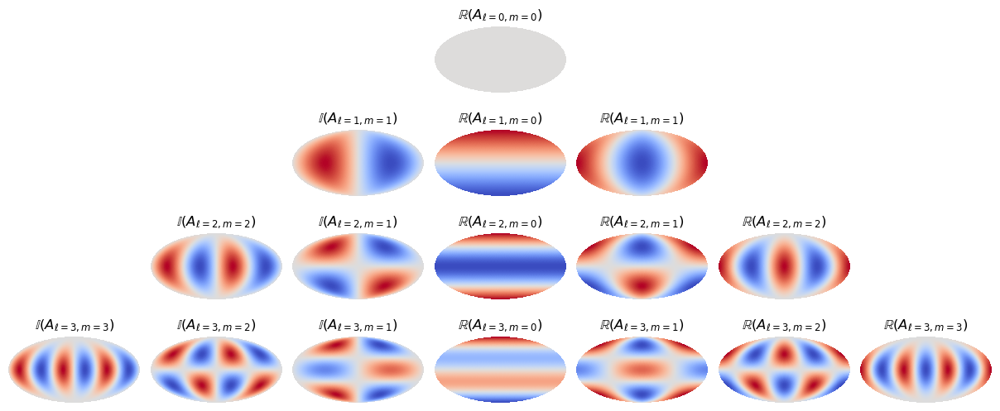

In [22]:
lm=3
plt.figure(figsize=(12,5))
for k in range(l_func.shape[0]):
    pos=1+l_func[k]*(2*lm+1)+2*(is_real_func[k]-0.5)*m_func[k]-1+(lm+1)
    if is_real_func[k]==1:
        title='$\mathbb{R}(A_{\ell=%d,m=%d})$'%(l_func[k],m_func[k])
    else:
        title='$\mathbb{I}(A_{\ell=%d,m=%d})$'%(l_func[k],m_func[k])
    if l_func[k]<=lm:
        hp.mollview(function[k],nest=True,hold=False,sub=(lm+1,2*lm+1,pos)
                    ,title=title,cbar=False,cmap='coolwarm')

In [ ]:
client.close()

<div class=\"alert alert-success\">
<i class=\"fa-check-circle fa\" style=\"font-size: 22px;color:#666;\"></i> <b>Key Points</b>
<br>
<ul>
   <li>HALPIx</li>
   <li>Access, read and get metadata from remote and local zarr</li>
   </ul>
</div>

 ## References

```{bibliography}
:style: alpha
:filter: topic % "SST" and not topic % "package"
:keyprefix: a-
```

## Packages citation

```{bibliography}
:style: alpha
:filter: topic % "SST" and topic % "package"
:keyprefix: a-
```